# Gaussian Process Classification

## Preliminary steps

### Loading necessary packages

In [1]:
using Plots
using HTTP, CSV
using DataFrames: DataFrame
using AugmentedGaussianProcesses
using MLDataUtils

### Loading the banana dataset from OpenML

In [2]:
data = HTTP.get("https://www.openml.org/data/get_csv/1586217/phpwRjVjk")
data = CSV.read(data.body, DataFrame)
data.Class[data.Class .== 2] .= -1
data = Matrix(data)
X = data[:, 1:2]
Y = Int.(data[:, end]);
(X_train, y_train), (X_test, y_test) = splitobs((X, Y), 0.5, ObsDim.First()) # We split the data into train and test set

(([1.14 -0.114; -1.52 -1.15; … ; -0.0708 0.439; 0.177 -1.37], [1, -1, 1, -1, -1, -1, 1, -1, -1, -1  …  1, -1, 1, -1, -1, -1, 1, -1, -1, 1]), ([-0.135 0.136; -0.288 0.385; … ; 0.769 0.772; -0.255 -0.142], [-1, -1, -1, 1, 1, -1, -1, 1, -1, 1  …  -1, -1, -1, -1, -1, -1, -1, -1, 1, -1]))

### We create a function to visualize the data

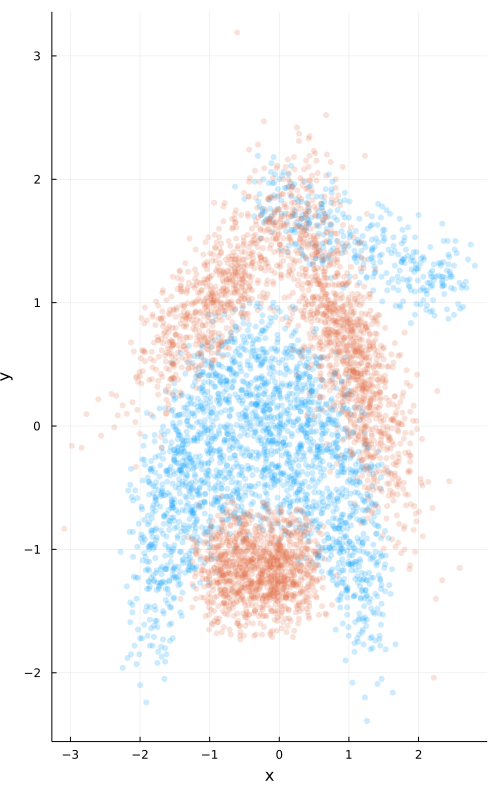

In [3]:
function plot_data(X, Y; size=(300, 500))
    return Plots.scatter(
        eachcol(X)...; xlabel="x", ylabel="y", group=Y, alpha=0.2, markerstrokewidth=0.0, lab="", size=size
    )
end
plot_data(X, Y; size=(500, 800))

## Model initialization and training
Using Gaussian processes to solve binary classification problem is usually defined as
$$
  y \sim \mathrm{Bernoulli}(h(f))
$$
where ``h`` is the inverse link.
Multiple choices exist for ``h`` but we will focus mostly on ``h(x)=\sigma(x)=(1+\exp(-x))^{-1}``, i.e. the logistic function.
### Run sparse classification with an increasing number of inducing points

In [4]:
Ms = [4, 8, 16, 32, 64] # Number of inducing points
models = Vector{AbstractGPModel}(undef, length(Ms) + 1)
kernel = with_lengthscale(SqExponentialKernel(), 1.0) # We create a standard kernel with lengthscale 1
for (i, num_inducing) in enumerate(Ms)
    @info "Training with $(num_inducing) points"
    m = SVGP(
        kernel,
        LogisticLikelihood(),
        AnalyticVI(),
        inducingpoints(KmeansAlg(num_inducing), X); # Z is selected via the kmeans algorithm
        optimiser=false, # We keep the kernel parameters fixed
        Zoptimiser=false, # We keep the inducing points locations fixed
    )
    @time train!(m, X_train, y_train, 5) # We train the model on the training data for 5 iterations
    models[i] = m # And store the model
end

[ Info: Training with 4 points
  9.455380 seconds (20.72 M allocations: 1.114 GiB, 6.20% gc time, 99.65% compilation time)
[ Info: Training with 8 points
  0.003534 seconds (869 allocations: 4.319 MiB)
[ Info: Training with 16 points
  0.007455 seconds (893 allocations: 7.668 MiB)
[ Info: Training with 32 points
  0.013417 seconds (941 allocations: 14.532 MiB)
[ Info: Training with 64 points
  0.025381 seconds (1.10 k allocations: 28.946 MiB)


### We initiliaze and train the non sparse model

In [5]:
@info "Running full model"
mfull = VGP(X_train, y_train, kernel, LogisticLikelihood(), AnalyticVI(); optimiser=false)
@time train!(mfull, 5)
models[end] = mfull

[ Info: Running full model
  6.941822 seconds (3.73 M allocations: 2.459 GiB, 5.66% gc time, 27.81% compilation time)


Variational Gaussian Process with a BernoulliLikelihood{GPLikelihoods.LogisticLink}(GPLikelihoods.LogisticLink(LogExpFunctions.logistic)) infered by Analytic Variational Inference 

## Prediction visualization
### We create a prediction and plot function on a grid

In [6]:
function compute_grid(model, n_grid=50)
    mins = [-3.25, -2.85]
    maxs = [3.65, 3.4]
    x_lin = range(mins[1], maxs[1]; length=n_grid)
    y_lin = range(mins[2], maxs[2]; length=n_grid)
    x_grid = Iterators.product(x_lin, y_lin)
    y_grid, _ = proba_y(model, vec(collect.(x_grid)))
    return y_grid, x_lin, y_lin
end

function plot_model(model, X, Y, title=nothing; size=(300, 500))
    n_grid = 50
    y_pred, x_lin, y_lin = compute_grid(model, n_grid)
    title = if isnothing(title)
        (model isa SVGP ? "M = $(AGP.dim(model[1]))" : "full")
    else
        title
    end
    p = plot_data(X, Y; size=size)
    Plots.contour!(
        p,
        x_lin,
        y_lin,
        reshape(y_pred, n_grid, n_grid)';
        cbar=false,
        levels=[0.5],
        fill=false,
        color=:black,
        linewidth=2.0,
        title=title,
    )
    if model isa SVGP
        Plots.scatter!(
            p, eachrow(hcat(AGP.Zview(model[1])...))...; msize=2.0, color="black", lab=""
        )
    end
    return p
end;

### Now run the prediction for every model and visualize the differences

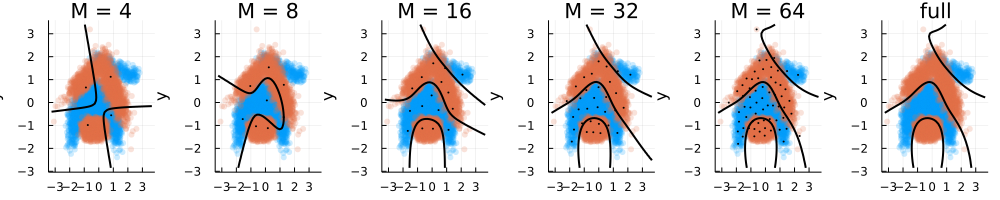

In [7]:
Plots.plot(
    plot_model.(models, Ref(X), Ref(Y))...; layout=(1, length(models)), size=(1000, 200)
)

## Bayesian SVM vs Logistic link
### We now create another full model but with the Bayesian SVM link

In [8]:
@info "Running model with Bayesian SVM Likelihood"
mbsvm = VGP(X_train, y_train, kernel, BayesianSVM(), AnalyticVI(); optimiser=false)
@time train!(mbsvm, 5)

[ Info: Running model with Bayesian SVM Likelihood
  5.563818 seconds (1.61 M allocations: 2.344 GiB, 2.41% gc time, 15.70% compilation time)


(Variational Gaussian Process with a BernoulliLikelihood{AugmentedGaussianProcesses.SVMLink}(AugmentedGaussianProcesses.SVMLink()) infered by Analytic Variational Inference , (local_vars = (c = [0.1906645912380093, 0.2316454066551576, 0.0031544471159122432, 0.13783608432022054, 0.23493768647450722, 4.754524325433522, 1.6762565726889644, 1.4822238505141967, 0.4547369073038404, 0.07199295745925183  …  0.3674542315153447, 0.46906021066831666, 0.1031103663086419, 0.8201390461836188, 3.2678129506898244, 0.6793569622949217, 5.001778909677067, 0.4947182427858625, 1.2812846432091354, 2.9561752313256306], θ = [2.2901555264091624, 2.077725421639047, 17.804852267936372, 2.693509653947361, 2.0631160426401802, 0.4586131076254991, 0.7723777475469318, 0.8213780661286769, 1.4829274286958798, 3.7269622397587026  …  1.6496749262186379, 1.4601104286330888, 3.1142167419961586, 1.1042216441038075, 0.5531862862463939, 1.2132519128676391, 0.44713406146263407, 1.421742799250176, 0.8834402651845333, 0.58161408

### And compare it with the Logistic likelihood

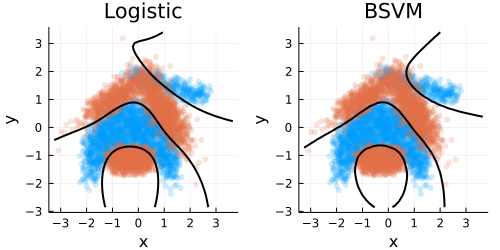

In [9]:
Plots.plot(
    plot_model.(
        [models[end], mbsvm], Ref(X), Ref(Y), ["Logistic", "BSVM"]; size=(500, 250)
    )...;
    layout=(1, 2),
)

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*